In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling

In [2]:
from sklearn.datasets import load_boston

In [3]:
Data = load_boston()

In [4]:
Data.keys()

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])

In [5]:
df = pd.DataFrame(Data.data,columns=Data.feature_names)

In [6]:
df['Cost']=Data.target

In [7]:
df

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Cost
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48,22.0


In [8]:
df.to_csv("Data/boston.csv")

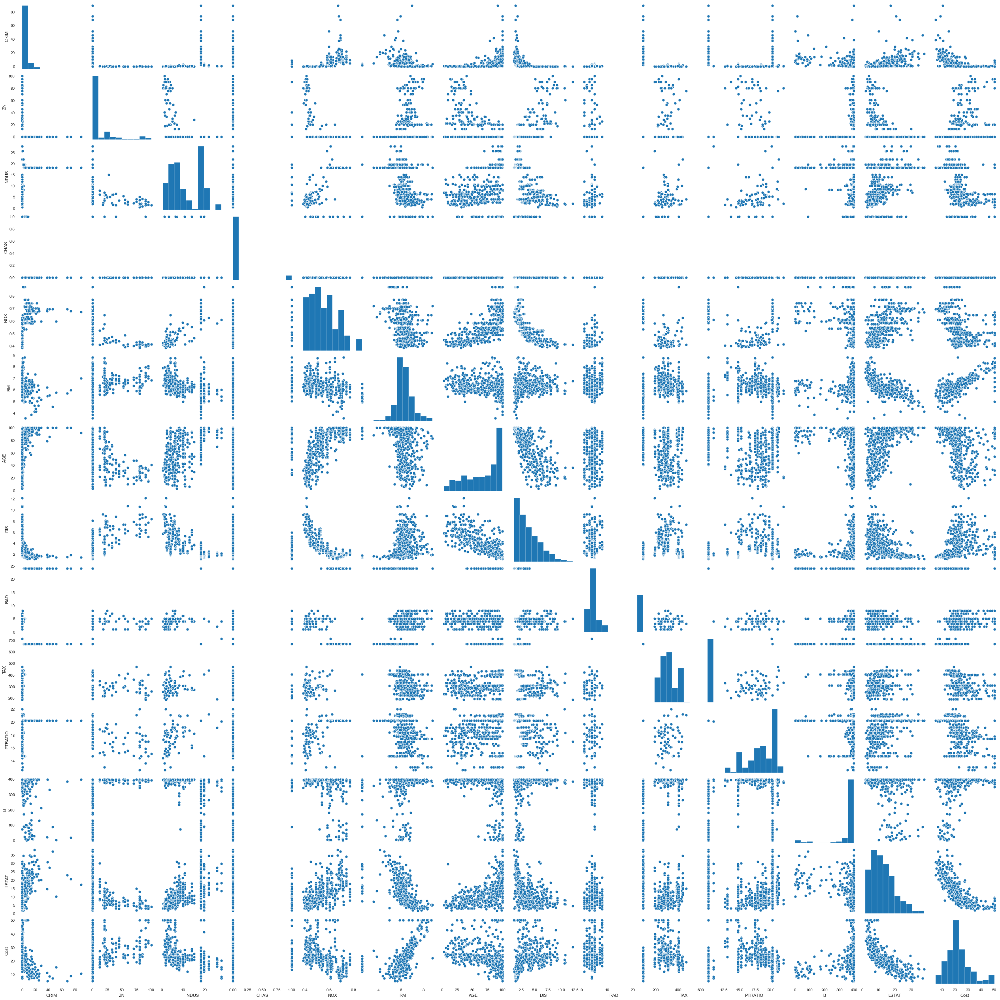

In [9]:
sns.pairplot(df)

c:\users\reddy\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


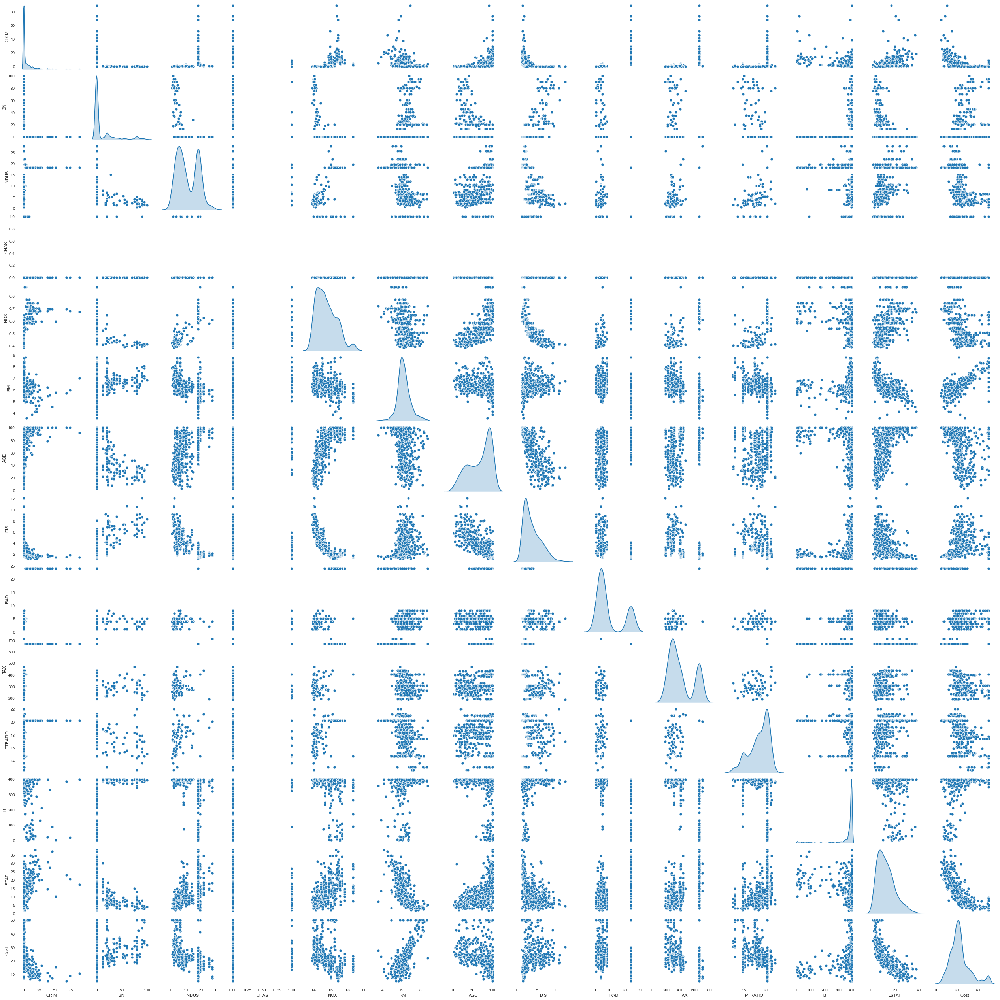

In [11]:
pandas_profilingpairplot(df, diag_kind="kde")

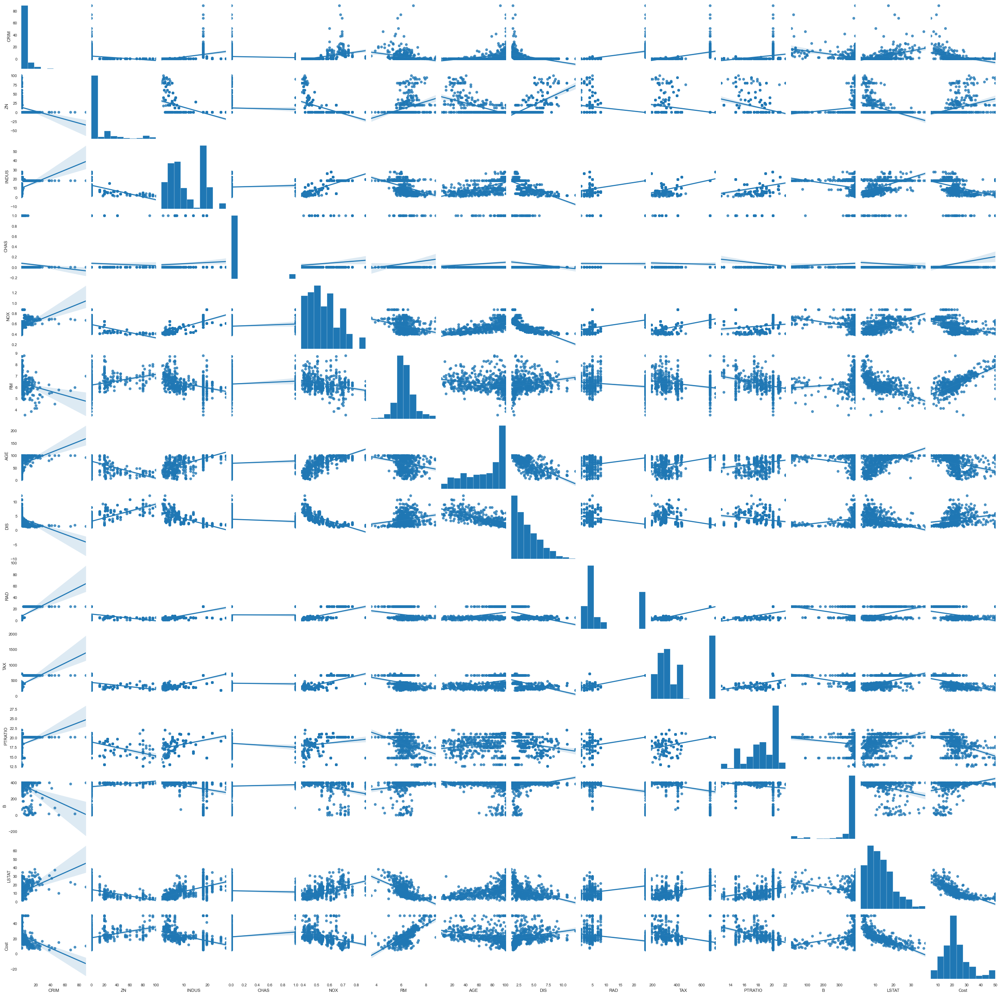

In [12]:
sns.pairplot(df,kind="reg")

In [17]:
pandas_profiling.ProfileReport(df)

In [21]:
X = df.drop('Cost', axis=1).values
X[0:2]

array([[6.3200e-03, 1.8000e+01, 2.3100e+00, 0.0000e+00, 5.3800e-01,
        6.5750e+00, 6.5200e+01, 4.0900e+00, 1.0000e+00, 2.9600e+02,
        1.5300e+01, 3.9690e+02, 4.9800e+00],
       [2.7310e-02, 0.0000e+00, 7.0700e+00, 0.0000e+00, 4.6900e-01,
        6.4210e+00, 7.8900e+01, 4.9671e+00, 2.0000e+00, 2.4200e+02,
        1.7800e+01, 3.9690e+02, 9.1400e+00]])

In [19]:
Y = df['Cost']

In [22]:
X_rooms = X[:,5]

Text(0.5, 0, 'Number of rooms')

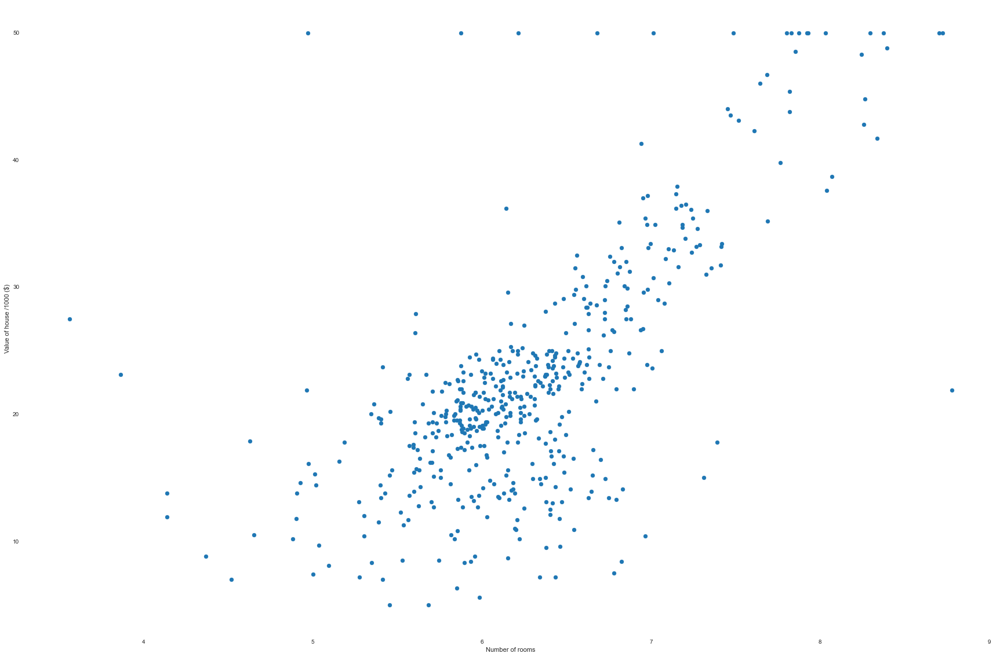

In [28]:
plt.figure(figsize=(30,20))
plt.scatter(X_rooms,Y)
plt.ylabel('Value of house /1000 ($)')
plt.xlabel('Number of rooms')

### withOut Normalization Data 

In [29]:
from sklearn.linear_model import LinearRegression

In [30]:
Lr = LinearRegression()

In [31]:
Lr.fit(X,y)

LinearRegression()

In [34]:
importance = Lr.coef_
importance

array([-1.08011358e-01,  4.64204584e-02,  2.05586264e-02,  2.68673382e+00,
       -1.77666112e+01,  3.80986521e+00,  6.92224640e-04, -1.47556685e+00,
        3.06049479e-01, -1.23345939e-02, -9.52747232e-01,  9.31168327e-03,
       -5.24758378e-01])

**Note:** A negative correlation describes the extent to which two variables move in opposite directions

In [33]:
Lr.intercept_

36.459488385089855

In [35]:
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v))

Feature: 0, Score: -0.10801
Feature: 1, Score: 0.04642
Feature: 2, Score: 0.02056
Feature: 3, Score: 2.68673
Feature: 4, Score: -17.76661
Feature: 5, Score: 3.80987
Feature: 6, Score: 0.00069
Feature: 7, Score: -1.47557
Feature: 8, Score: 0.30605
Feature: 9, Score: -0.01233
Feature: 10, Score: -0.95275
Feature: 11, Score: 0.00931
Feature: 12, Score: -0.52476


<BarContainer object of 13 artists>

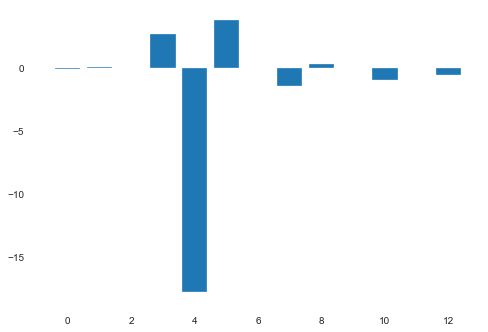

In [37]:
plt.bar([x for x in range(len(importance))],importance)

#### After Scaling Linear Regression

In [38]:
from sklearn.preprocessing import StandardScaler

In [39]:
ss = StandardScaler()

In [41]:
x_Scaled = ss.fit_transform(X)
x_Scaled

array([[-0.41978194,  0.28482986, -1.2879095 , ..., -1.45900038,
         0.44105193, -1.0755623 ],
       [-0.41733926, -0.48772236, -0.59338101, ..., -0.30309415,
         0.44105193, -0.49243937],
       [-0.41734159, -0.48772236, -0.59338101, ..., -0.30309415,
         0.39642699, -1.2087274 ],
       ...,
       [-0.41344658, -0.48772236,  0.11573841, ...,  1.17646583,
         0.44105193, -0.98304761],
       [-0.40776407, -0.48772236,  0.11573841, ...,  1.17646583,
         0.4032249 , -0.86530163],
       [-0.41500016, -0.48772236,  0.11573841, ...,  1.17646583,
         0.44105193, -0.66905833]])

In [45]:
X_rooms = x_Scaled[:,5]

Text(0.5, 0, 'Number of rooms')

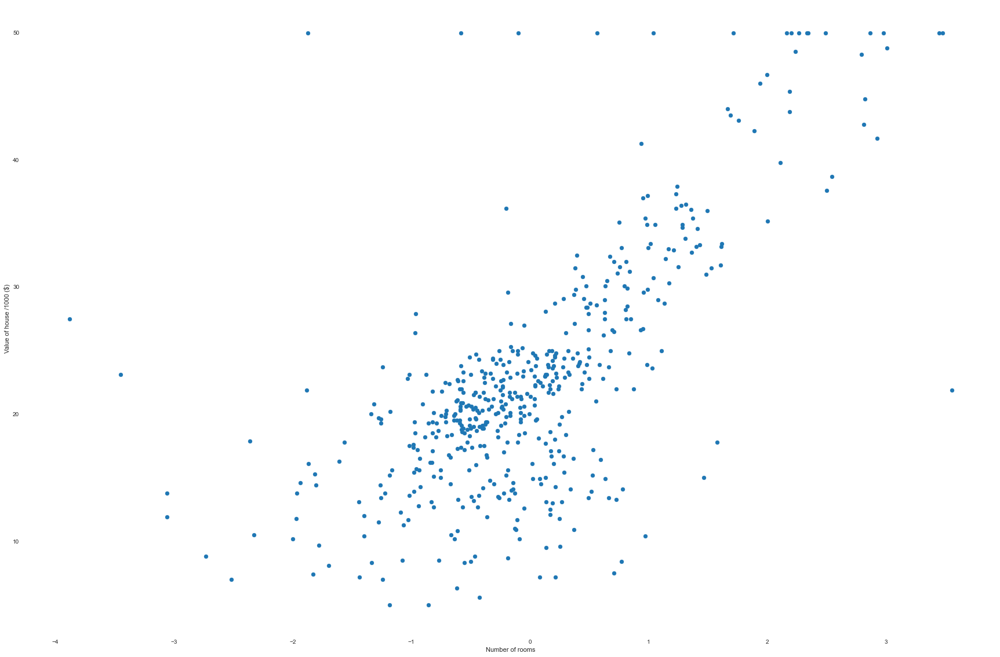

In [46]:
plt.figure(figsize=(30,20))
plt.scatter(X_rooms,Y)
plt.ylabel('Value of house /1000 ($)')
plt.xlabel('Number of rooms')

In [42]:
Lr_scale = LinearRegression()

In [47]:
Lr_scale.fit(x_Scaled,y)

LinearRegression()

In [51]:
imp = Lr_scale.coef_
imp

array([-0.92814606,  1.08156863,  0.1409    ,  0.68173972, -2.05671827,
        2.67423017,  0.01946607, -3.10404426,  2.66221764, -2.07678168,
       -2.06060666,  0.84926842, -3.74362713])

In [49]:
Lr.intercept_

36.459488385089855

In [56]:
for i,v in enumerate(imp):
    print('Feature: %0d, Score: %.2f' % (i,v))

Feature: 0, Score: -0.93
Feature: 1, Score: 1.08
Feature: 2, Score: 0.14
Feature: 3, Score: 0.68
Feature: 4, Score: -2.06
Feature: 5, Score: 2.67
Feature: 6, Score: 0.02
Feature: 7, Score: -3.10
Feature: 8, Score: 2.66
Feature: 9, Score: -2.08
Feature: 10, Score: -2.06
Feature: 11, Score: 0.85
Feature: 12, Score: -3.74


<BarContainer object of 13 artists>

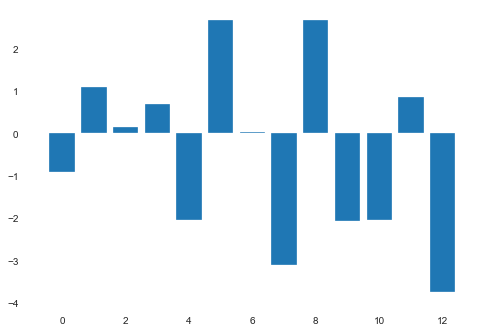

In [53]:
plt.bar([x for x in range(len(imp))],imp)